In [1]:
import os
import sys
import time
import io

import torch
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import torch.utils.data as tdata
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from tqdm.notebook import tqdm
import wandb

In [2]:
from anime_face_generator.config import PROCESSED_DATA_DIR, RAW_DATA_DIR, MODELS_DIR
import anime_face_generator.modeling.models.mega_unet_ddpm_74M as Mega
from anime_face_generator.modeling.train import train_model

%load_ext autoreload
%autoreload 2

2025-08-13 23:01:57.808 | INFO     | anime_face_generator.config:<module>:11 - PROJ_ROOT path is: /home/ayoubvip/anime_face_generator


![Algorithm1](https://learnopencv.com/wp-content/uploads/2023/02/denoising-diffusion-probabilistic-models_DDPM_trainig_inference_algorithm-1024x247.png)

In [3]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
print("number of GPUs:", torch.cuda.device_count())

Using device: cuda
number of GPUs: 2


## Data augmentation

In [4]:
transformers = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=Mega.ModelParams.im_size),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
])

dataset = torchvision.datasets.ImageFolder(root=PROCESSED_DATA_DIR, transform=transformers, target_transform=None)

In [5]:
rand_gen = torch.Generator().manual_seed(1978)

## Unet Denoiser Architecture

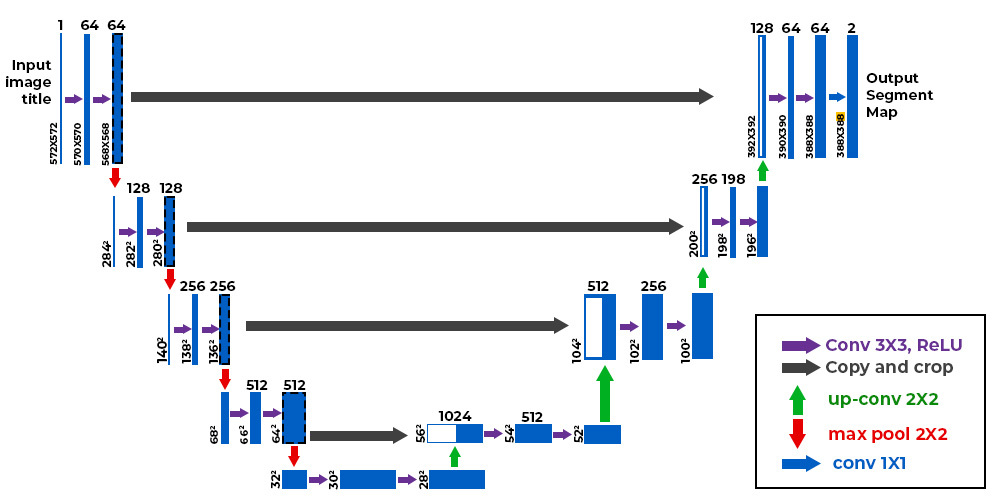

wandb: ERROR Failed to detect the name of this notebook. You can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: ayoub-dev2000 (ayoub-dev2000-university-of-liege) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


---------------------------------------------
 EPOCH 1
---------------------------------------------
train loss: 1.120854  [    2/72454]
val loss: 1.065079  [    2/72454]
timestep in first x in the batch:  83


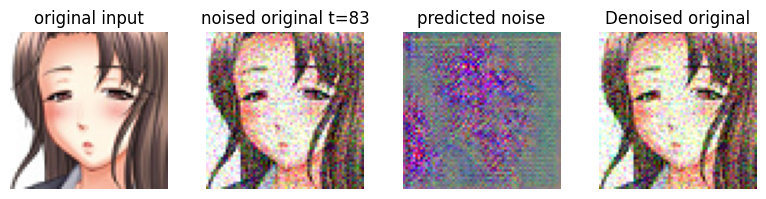

train loss: 0.042546  [ 1602/72454]
val loss: 0.093689  [ 1602/72454]
timestep in first x in the batch:  491


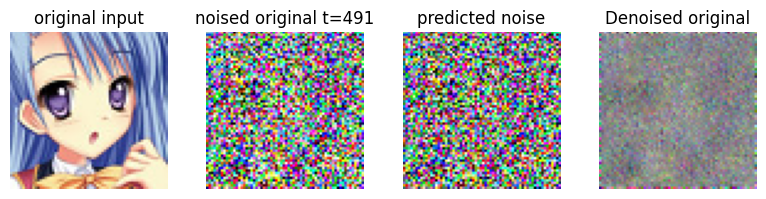

train loss: 0.048760  [ 3202/72454]
val loss: 0.061188  [ 3202/72454]
timestep in first x in the batch:  319


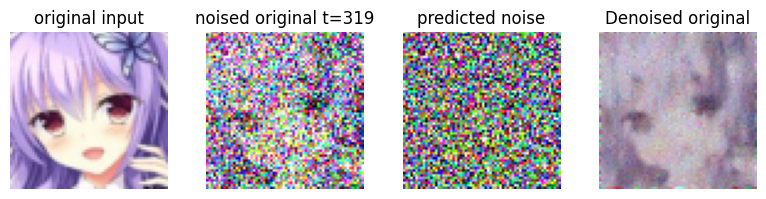

train loss: 0.020031  [ 4802/72454]
val loss: 0.052298  [ 4802/72454]
timestep in first x in the batch:  191


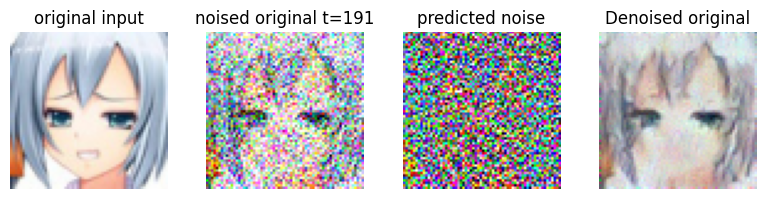

train loss: 0.252198  [ 6402/72454]
val loss: 0.052319  [ 6402/72454]
timestep in first x in the batch:  743


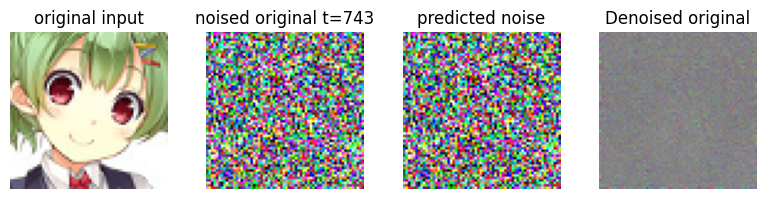

train loss: 0.005205  [ 8002/72454]
val loss: 0.044315  [ 8002/72454]
timestep in first x in the batch:  138


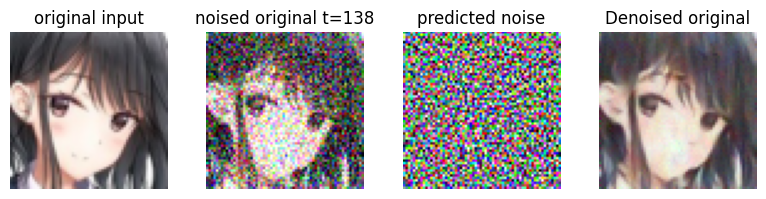

train loss: 0.036813  [ 9602/72454]
val loss: 0.044088  [ 9602/72454]
timestep in first x in the batch:  826


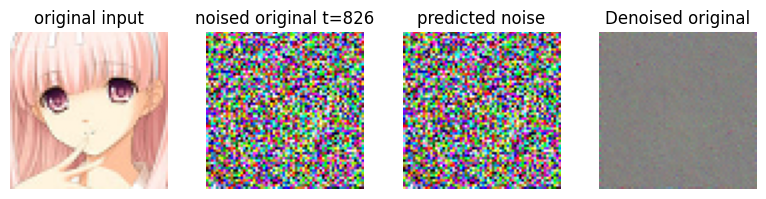

train loss: 0.002995  [11202/72454]
val loss: 0.045157  [11202/72454]
timestep in first x in the batch:  502


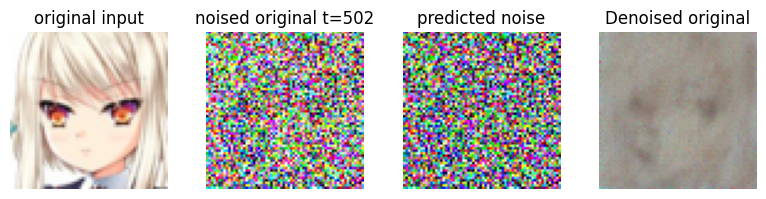

train loss: 0.002285  [12802/72454]
val loss: 0.034752  [12802/72454]
timestep in first x in the batch:  800


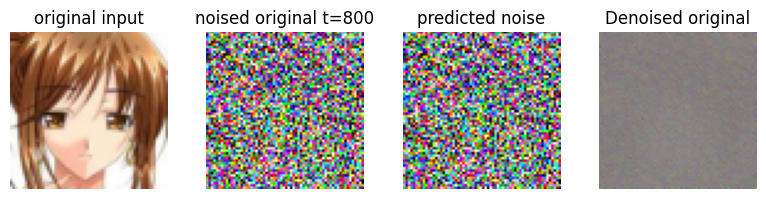

train loss: 0.084471  [14402/72454]
val loss: 0.037989  [14402/72454]
timestep in first x in the batch:  388


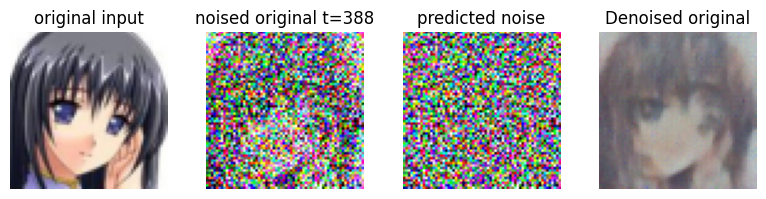

train loss: 0.016688  [16002/72454]
val loss: 0.044793  [16002/72454]
timestep in first x in the batch:  339


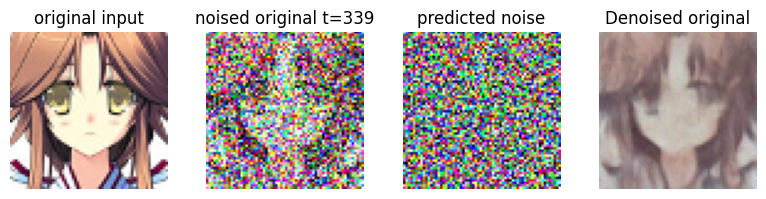

train loss: 0.008160  [17602/72454]
val loss: 0.034796  [17602/72454]
timestep in first x in the batch:  208


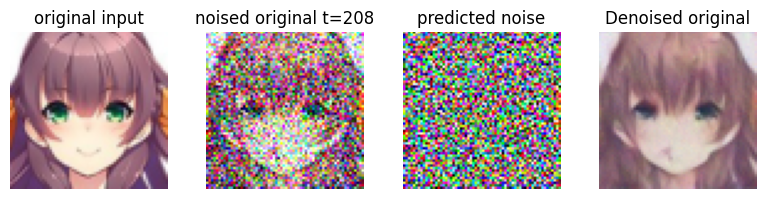

train loss: 0.069177  [19202/72454]
val loss: 0.037842  [19202/72454]
timestep in first x in the batch:  341


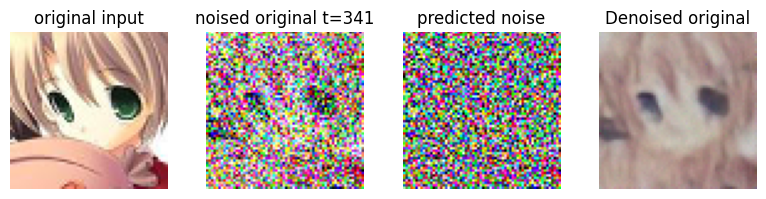

train loss: 0.050324  [20802/72454]
val loss: 0.037053  [20802/72454]
timestep in first x in the batch:  493


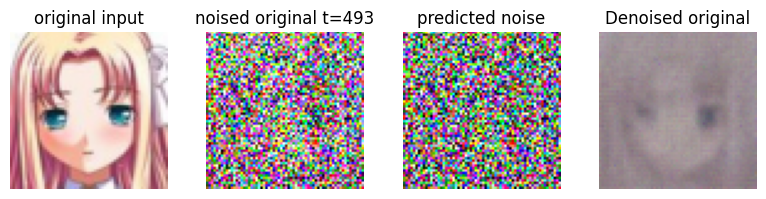

train loss: 0.036848  [22402/72454]
val loss: 0.037092  [22402/72454]
timestep in first x in the batch:  414


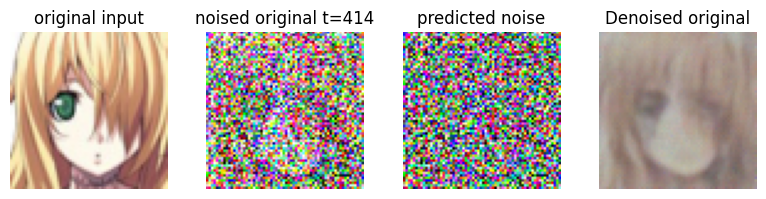

train loss: 0.029693  [24002/72454]
val loss: 0.040698  [24002/72454]
timestep in first x in the batch:  914


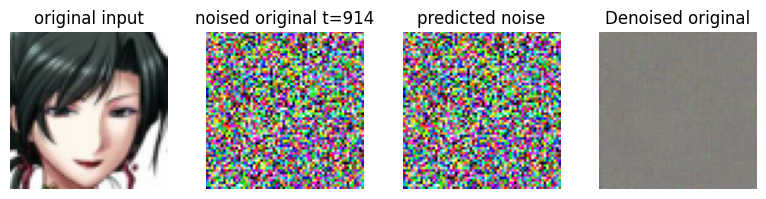

train loss: 0.039266  [25602/72454]
val loss: 0.036988  [25602/72454]
timestep in first x in the batch:  746


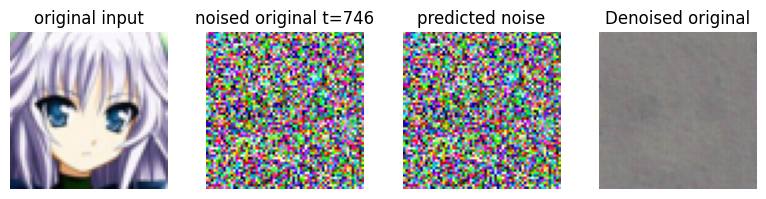

train loss: 0.005475  [27202/72454]
val loss: 0.036800  [27202/72454]
timestep in first x in the batch:  599


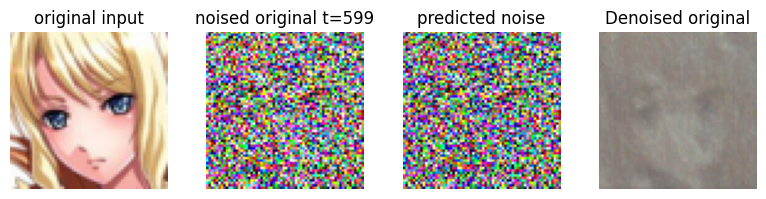

train loss: 0.007261  [28802/72454]
val loss: 0.036135  [28802/72454]
timestep in first x in the batch:  700


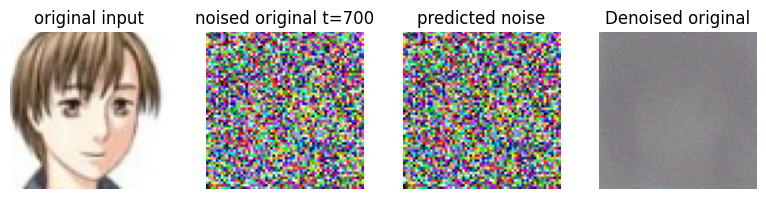

train loss: 0.017947  [30402/72454]
val loss: 0.036023  [30402/72454]
timestep in first x in the batch:  40


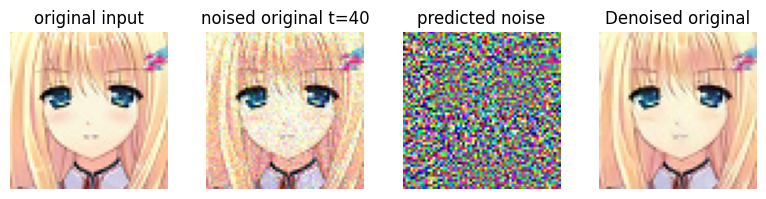

train loss: 0.156686  [32002/72454]
val loss: 0.035359  [32002/72454]
timestep in first x in the batch:  636


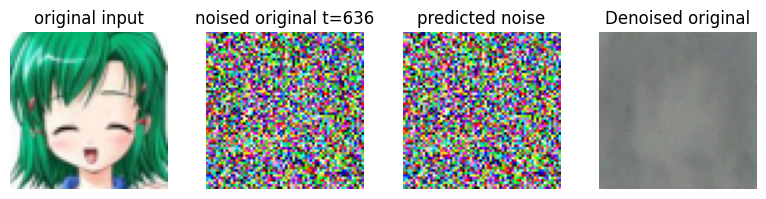

train loss: 0.039828  [33602/72454]
val loss: 0.030486  [33602/72454]
timestep in first x in the batch:  619


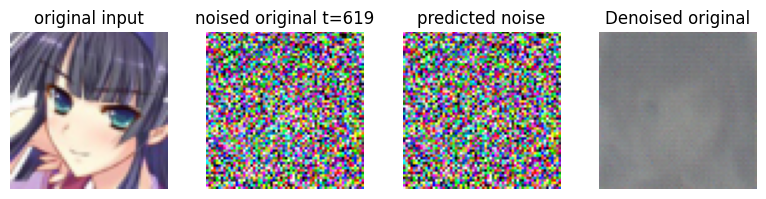

train loss: 0.011978  [35202/72454]
val loss: 0.037930  [35202/72454]
timestep in first x in the batch:  523


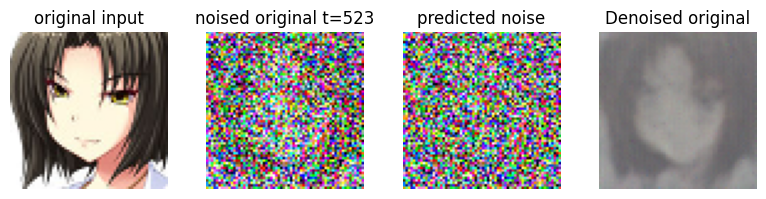

train loss: 0.084832  [36802/72454]
val loss: 0.042118  [36802/72454]
timestep in first x in the batch:  939


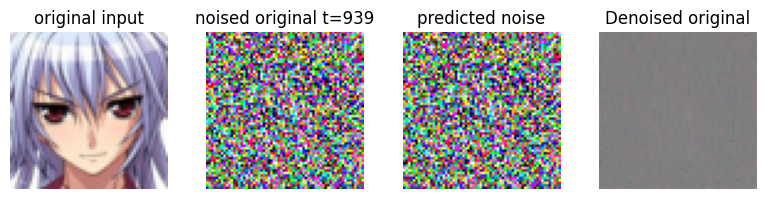

train loss: 0.002473  [38402/72454]
val loss: 0.036267  [38402/72454]
timestep in first x in the batch:  707


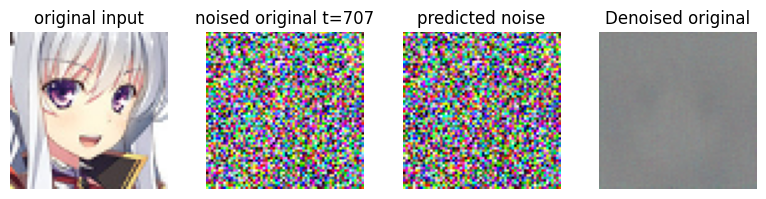

train loss: 0.001376  [40002/72454]
val loss: 0.030779  [40002/72454]
timestep in first x in the batch:  53


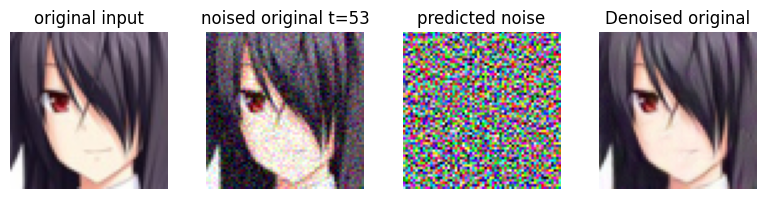

train loss: 0.013834  [41602/72454]
val loss: 0.033129  [41602/72454]
timestep in first x in the batch:  707


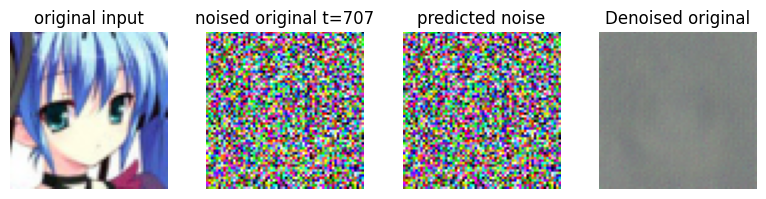

train loss: 0.024522  [43202/72454]
val loss: 0.037255  [43202/72454]
timestep in first x in the batch:  322


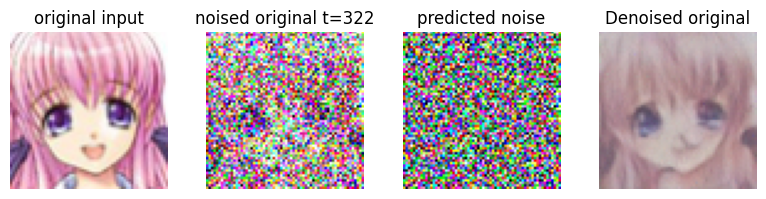

train loss: 0.044141  [44802/72454]
val loss: 0.033214  [44802/72454]
timestep in first x in the batch:  838


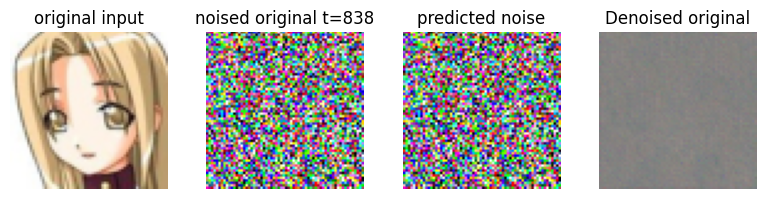

train loss: 0.005256  [46402/72454]
val loss: 0.038962  [46402/72454]
timestep in first x in the batch:  676


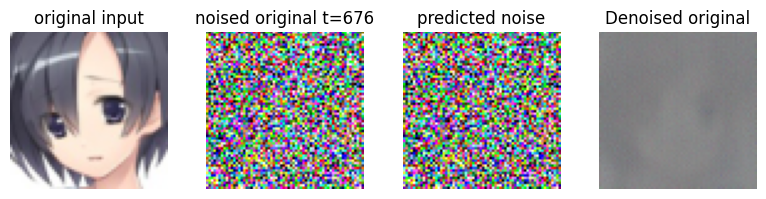

train loss: 0.001266  [48002/72454]
val loss: 0.033712  [48002/72454]
timestep in first x in the batch:  488


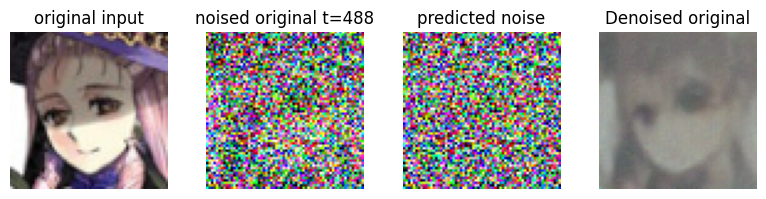

train loss: 0.018024  [49602/72454]
val loss: 0.035143  [49602/72454]
timestep in first x in the batch:  242


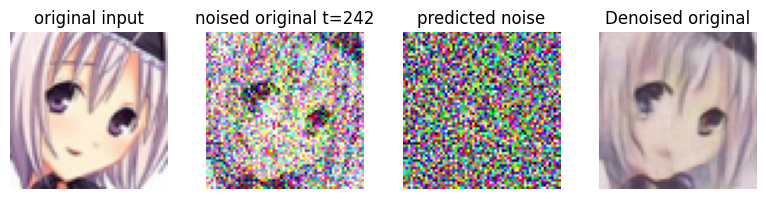

train loss: 0.021337  [51202/72454]
val loss: 0.034180  [51202/72454]
timestep in first x in the batch:  314


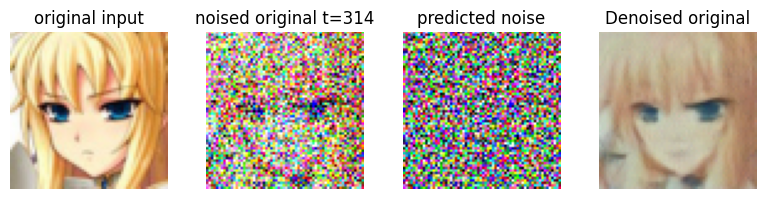

train loss: 0.005085  [52802/72454]
val loss: 0.035823  [52802/72454]
timestep in first x in the batch:  857


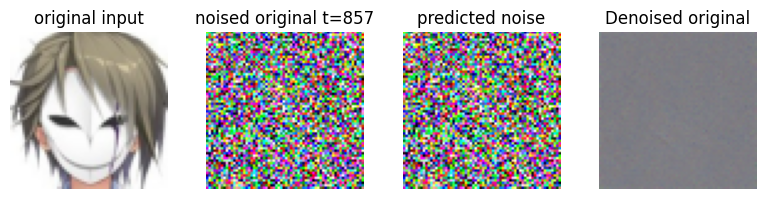

train loss: 0.003185  [54402/72454]
val loss: 0.038375  [54402/72454]
timestep in first x in the batch:  251


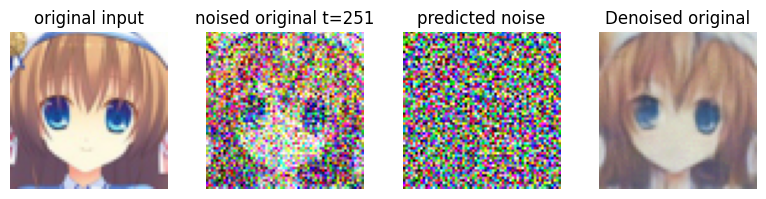

train loss: 0.042744  [56002/72454]
val loss: 0.032466  [56002/72454]
timestep in first x in the batch:  793


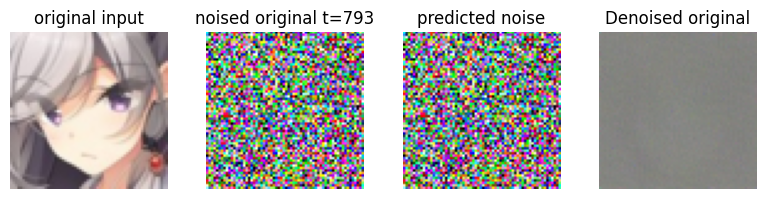

train loss: 0.004557  [57602/72454]
val loss: 0.038060  [57602/72454]
timestep in first x in the batch:  549


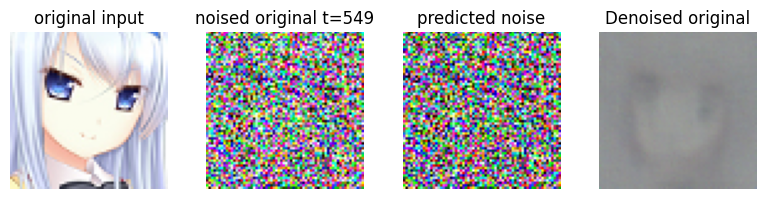

train loss: 0.174530  [59202/72454]
val loss: 0.034464  [59202/72454]
timestep in first x in the batch:  545


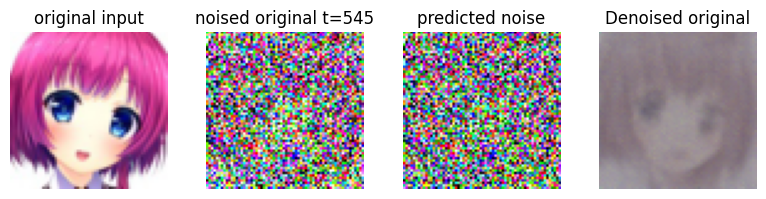

train loss: 0.000728  [60802/72454]
val loss: 0.029509  [60802/72454]
timestep in first x in the batch:  884


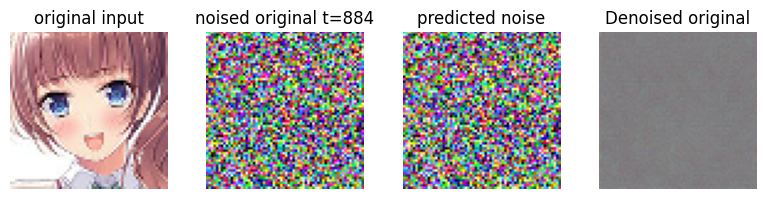

train loss: 0.021518  [62402/72454]
val loss: 0.029614  [62402/72454]
timestep in first x in the batch:  835


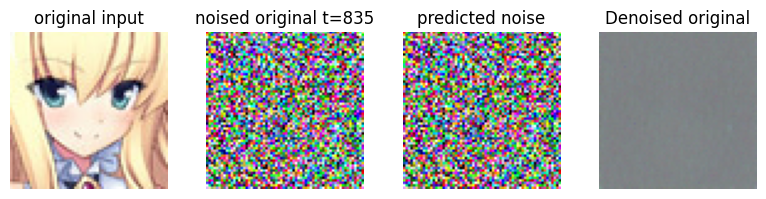

train loss: 0.039513  [64002/72454]
val loss: 0.034530  [64002/72454]
timestep in first x in the batch:  801


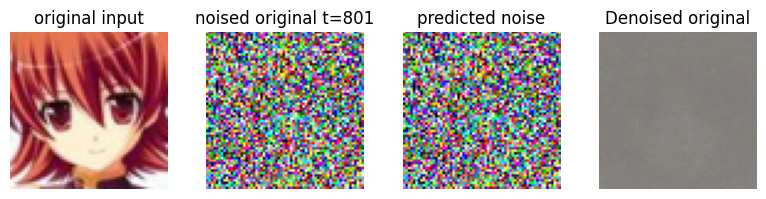

train loss: 0.004436  [65602/72454]
val loss: 0.037948  [65602/72454]
timestep in first x in the batch:  805


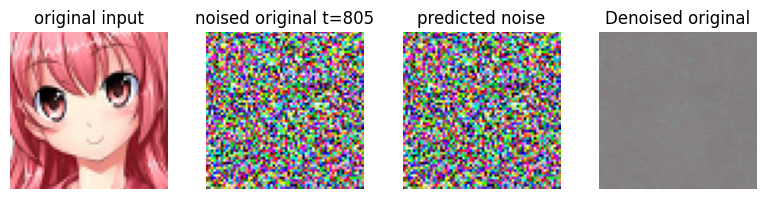

In [ ]:
os.environ['PYTORCH_CUDA_ALLOC_CONF']="expandable_segments:True"
mega_model_trained = train_model(module=Mega, dataset=dataset, device=device, rand_gen=rand_gen, wandb_logs=True)

## Simpling from the learned distribution

In [5]:
def show_images_grid_rgb(samples, nrow=8, ncol=6, epoch=0):
    fig, axes = plt.subplots(ncol, nrow, figsize=(nrow, ncol))
    samples = (samples + 1) / 2         # Rescale from [-1, 1] to [0, 1]
    samples = samples.clamp(0, 1).cpu() # Ensure valid pixel range
    samples = samples.permute(0, 2, 3, 1)  #(N, H, W, C) for plotting

    idx = 0
    for row in range(ncol):
        for col in range(nrow):
            if idx == samples.shape[0]:
                break
            axes[row, col].imshow(samples[idx])
            axes[row, col].axis('off')
            idx += 1
    plt.tight_layout()
    plt.title(f"Simple in epoch{epoch}")
    fig_name = str(model_backup)[0:-4] + '_epoch_'+ str(epoch) +'_samples.png'
    plt.savefig(FIGURES_DIR / fig_name, format='png')
    plt.show()

In [6]:
model = Mega.NoisePredictor()
reverse_diffusion = model.diffuser.reverse

for epoch in [1,2,4,5]:
    epoch = 1
    model_backup =  f"mega_unet_ddpm_74M_ckpt_epoch_{epoch}.pth"
    # "mega_unet_ddpm_85M_ckpt_epoch_2.pth"
    model.load_parameters(path=MODELS_DIR / model_backup)

    model = model.to(device)
    samples = model.generate_samples(num_samples=16)
    show_images_grid_rgb(samples, nrow=8, ncol=2, epoch=epoch)

num_model_params = model.get_num_trainable_parameters()
print(f"Number of trainable parameters: {num_model_params / 1e6:.2f}M")

OutOfMemoryError: CUDA out of memory. Tried to allocate 1024.00 MiB. GPU 0 has a total capacity of 23.67 GiB of which 875.12 MiB is free. Process 3557247 has 6.50 GiB memory in use. Process 3533692 has 10.66 GiB memory in use. Including non-PyTorch memory, this process has 5.65 GiB memory in use. Of the allocated memory 4.40 GiB is allocated by PyTorch, and 1.00 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

 ### Saving the notebook.

In [ ]:
from ipylab import JupyterFrontEnd
app = JupyterFrontEnd()
app.commands.execute('docmanager:save')